In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


# The statistical information of the dataset

In [3]:
import os
import zipfile
from xml.etree import ElementTree
from xml.dom import minidom
import collections

import os

import matplotlib.pyplot as plt
import matplotlib as matplot
import seaborn as sns
%matplotlib inline

# Specify the path to the zip file
zip_path = "/content/drive/MyDrive/N-RDD2024Road damage and defects (1).zip"
# Specify the directory where you want to extract the files
extracted_dir = "/content/"

# Create the directory if it doesn't exist
if not os.path.exists(extracted_dir):
    os.makedirs(extracted_dir)

# Extract the zip file
with zipfile.ZipFile(zip_path, 'r') as zip_ref:
    zip_ref.extractall(extracted_dir)

# Update the base path to point to the extracted directory
base_path = extracted_dir

In [4]:
import zipfile
import os

# Define the path to the directory containing the zip files
zip_files_dir = "/content/N-RDD2024Road damage and defects/Training and Validation Dataset/"

# List of zip files
zip_files = [
    "Czech Republic_txt.zip",
    "USA_txt.zip",
    "china-motorbike_txt.zip",
    "india_txt.zip",
    "japan_txt.zip",
    "norway_txt.zip"
]

# Loop through each zip file, create a directory for each country, and extract the contents
for zip_file in zip_files:
    # The country name is extracted from the zip file name by removing "_txt.zip"
    country_name = zip_file.replace("_txt.zip", "")

    # Define the directory where you want to extract the files for each country
    extracted_dir = f"/content/{country_name}/"

    # Create the directory if it doesn't exist
    if not os.path.exists(extracted_dir):
        os.makedirs(extracted_dir)

    # Extract the zip file into its respective directory
    with zipfile.ZipFile(zip_files_dir + zip_file, 'r') as zip_ref:
        zip_ref.extractall(extracted_dir)

print("All extractions completed!")

All extractions completed!


# Yolov5

In [5]:
!git clone https://github.com/ultralytics/yolov5  # clone
%cd yolov5
%pip install -qr requirements.txt comet_ml  # install

import torch
import utils
display = utils.notebook_init()  # checks

YOLOv5 🚀 v7.0-304-g22361691 Python-3.10.12 torch-2.2.1+cu121 CUDA:0 (Tesla T4, 15102MiB)


Setup complete ✅ (2 CPUs, 12.7 GB RAM, 42.7/78.2 GB disk)


## China Motorbike

In [6]:
!python train.py --img 640 --batch 16 --epochs 50 --data /content/yolov5/data.yaml --weights yolov5s.pt --cache

2024-04-22 12:30:01.421090: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-04-22 12:30:01.421149: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-04-22 12:30:01.531254: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
train: weights=yolov5s.pt, cfg=, data=/content/yolov5/data.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=50, batch_size=16, imgsz=640, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, evolve_population=data/hyps, resume_evolve=None, bucket=, cache=ram, image_weights=False, device=, multi_scale=False, single_c

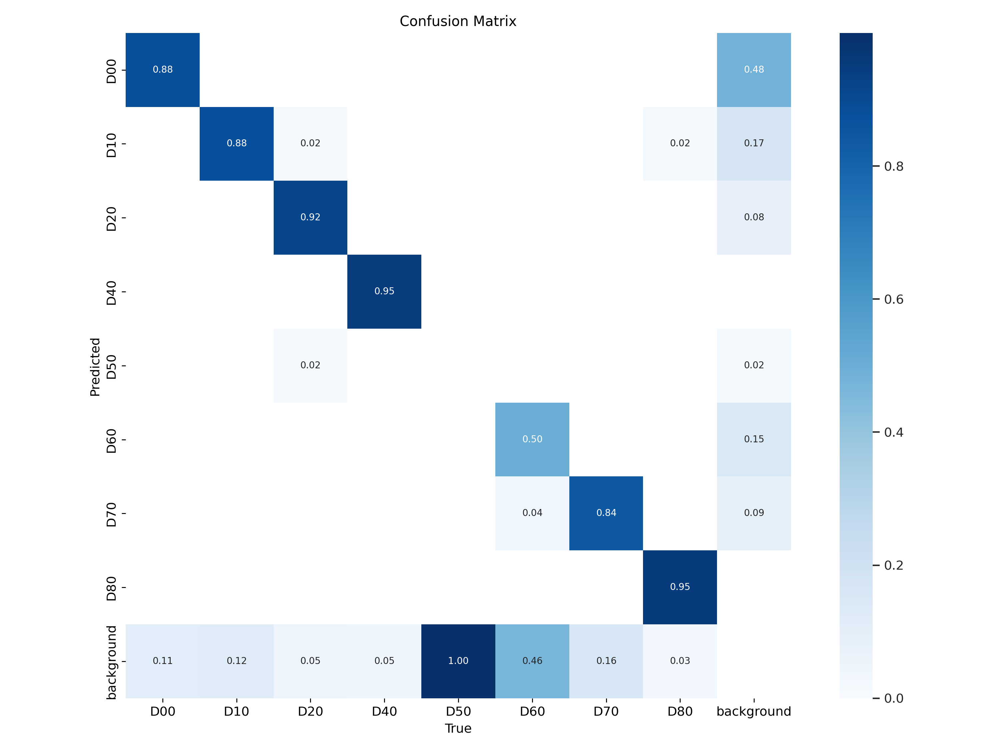

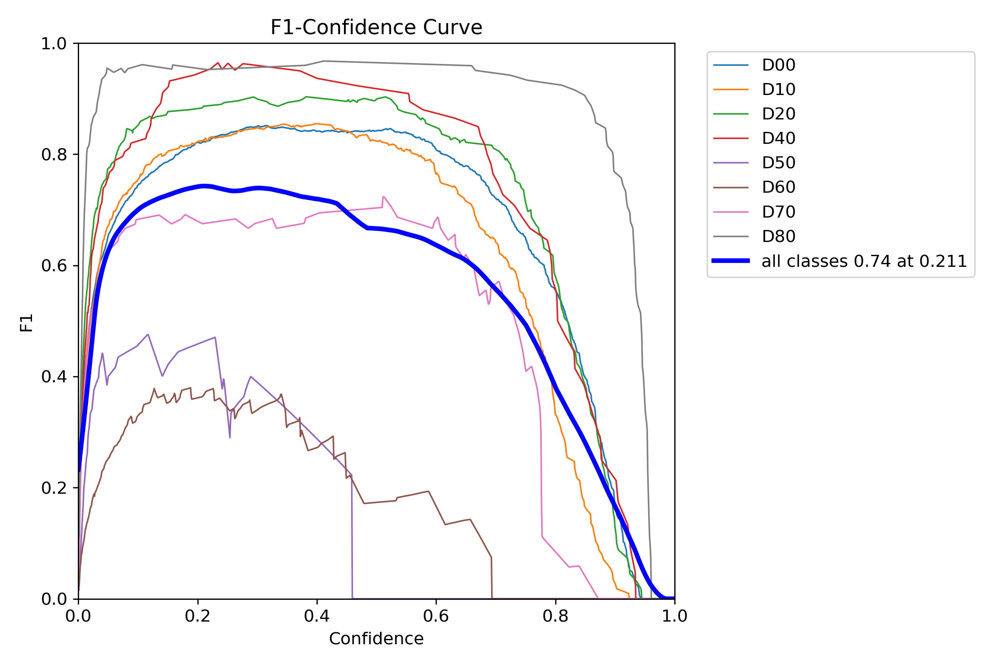

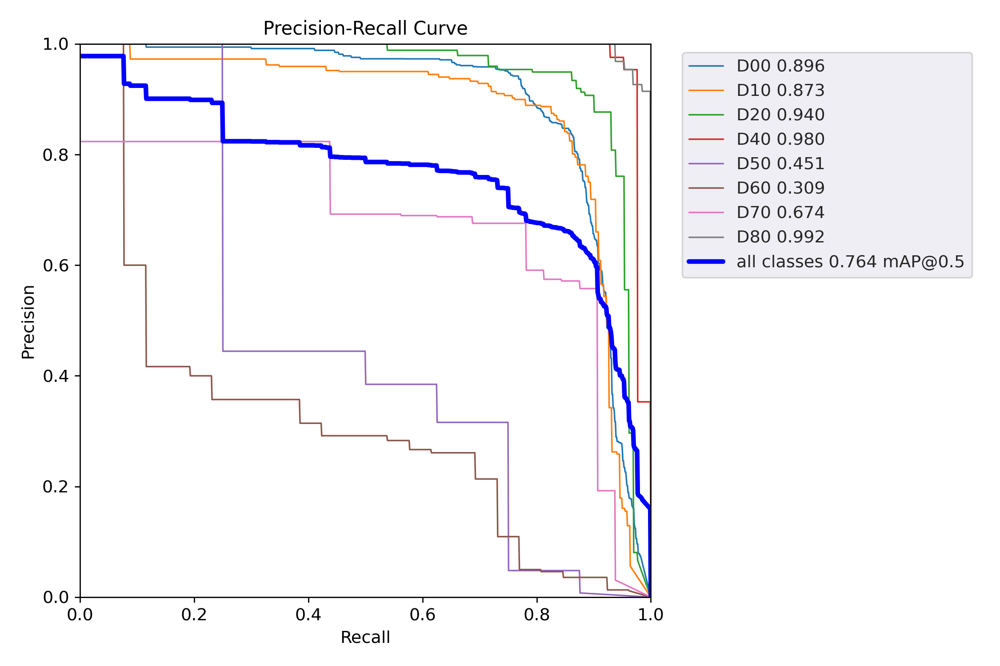

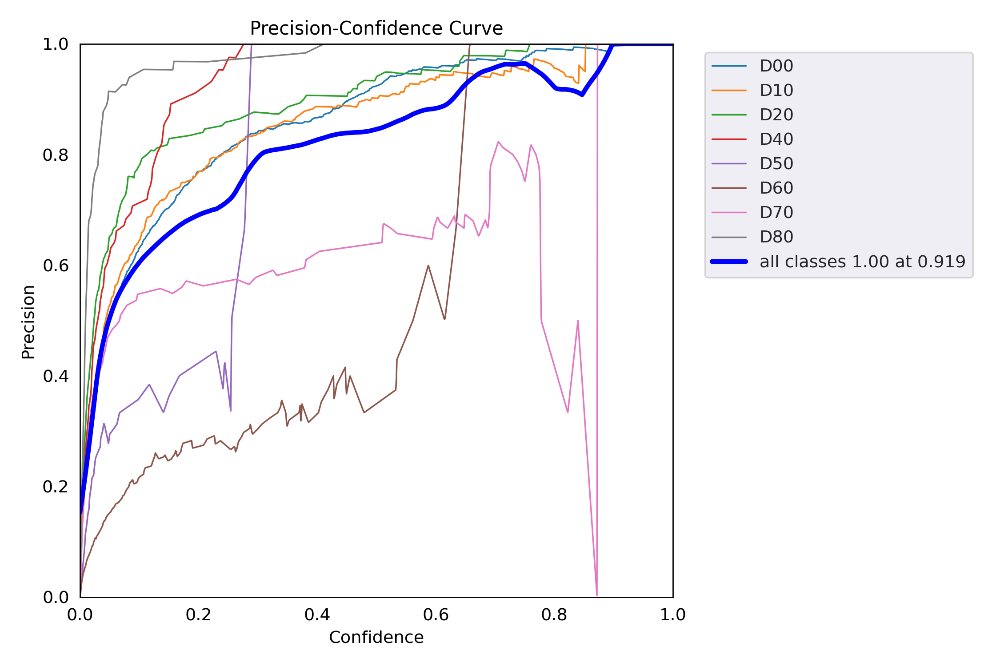

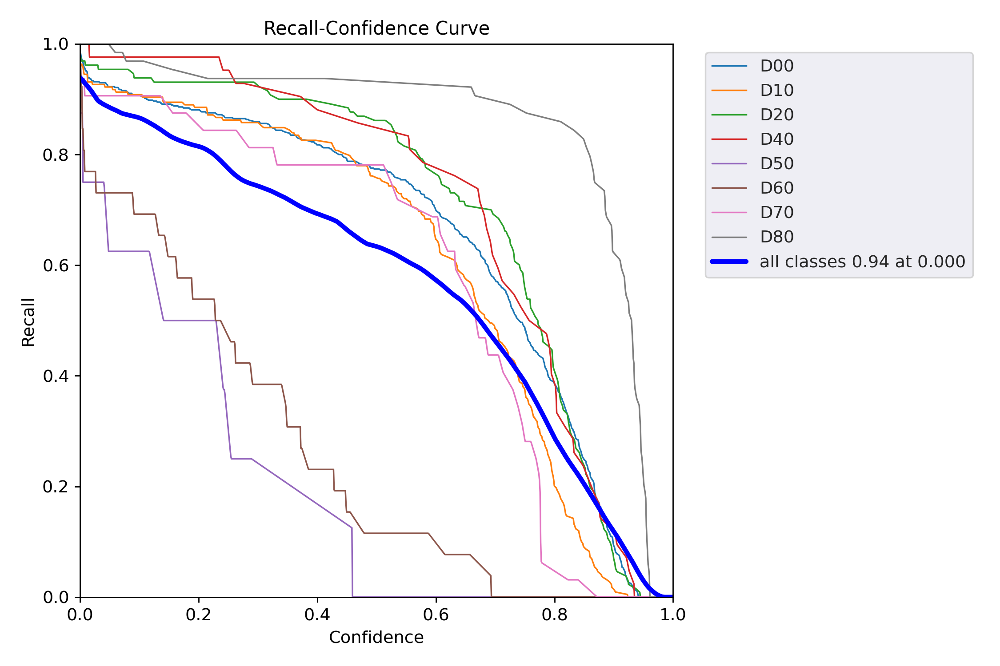

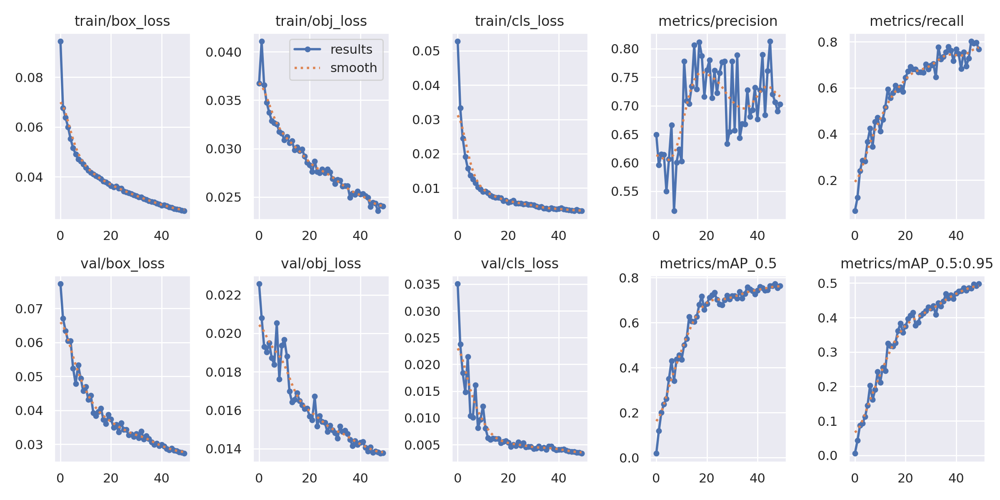

In [7]:
from IPython.display import Image, display

# List of image paths
image_paths = [
    '/content/yolov5/runs/train/exp/confusion_matrix.png',
    '/content/yolov5/runs/train/exp/F1_curve.png',
    '/content/yolov5/runs/train/exp/PR_curve.png',
    '/content/yolov5/runs/train/exp/P_curve.png',
    '/content/yolov5/runs/train/exp/R_curve.png',
    '/content/yolov5/runs/train/exp/results.png'
]

# Display images
for image_path in image_paths:
    display(Image(filename=image_path))

In [ ]:
#@title Select YOLOv5 🚀 logger {run: 'auto'}
logger = 'TensorBoard' #@param ['Comet', 'ClearML', 'TensorBoard']

if logger == 'Comet':
  %pip install -q comet_ml
  import comet_ml; comet_ml.init()
elif logger == 'ClearML':
  %pip install -q clearml
  import clearml; clearml.browser_login()
elif logger == 'TensorBoard':
  %load_ext tensorboard
  %tensorboard --logdir runs/train

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


<IPython.core.display.Javascript object>

## USA

In [ ]:
!cp /content/USA/data.yaml /content/yolov5/data.yaml

In [ ]:
!python train.py --img 640 --batch 16 --epochs 50 --data data.yaml --weights yolov5s.pt --cache

2024-04-02 19:17:11.831232: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-04-02 19:17:11.831281: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-04-02 19:17:11.832750: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
train: weights=yolov5s.pt, cfg=, data=data.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=50, batch_size=16, imgsz=640, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, evolve_population=data/hyps, resume_evolve=None, bucket=, cache=ram, image_weights=False, device=, multi_scale=False, single_cls=False, optimi

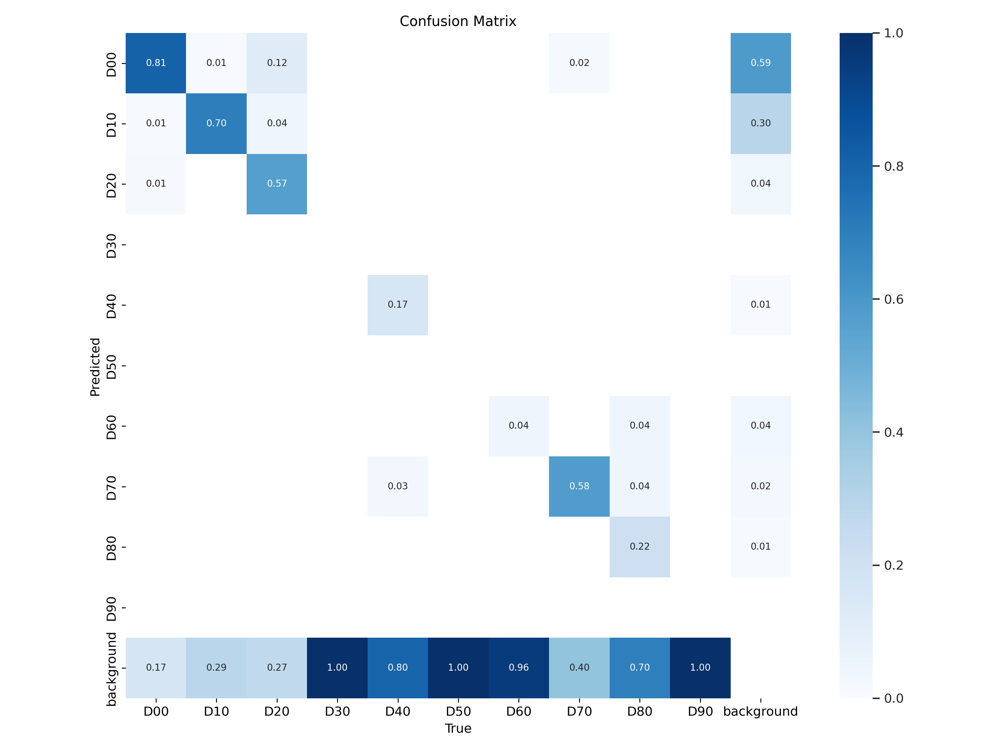

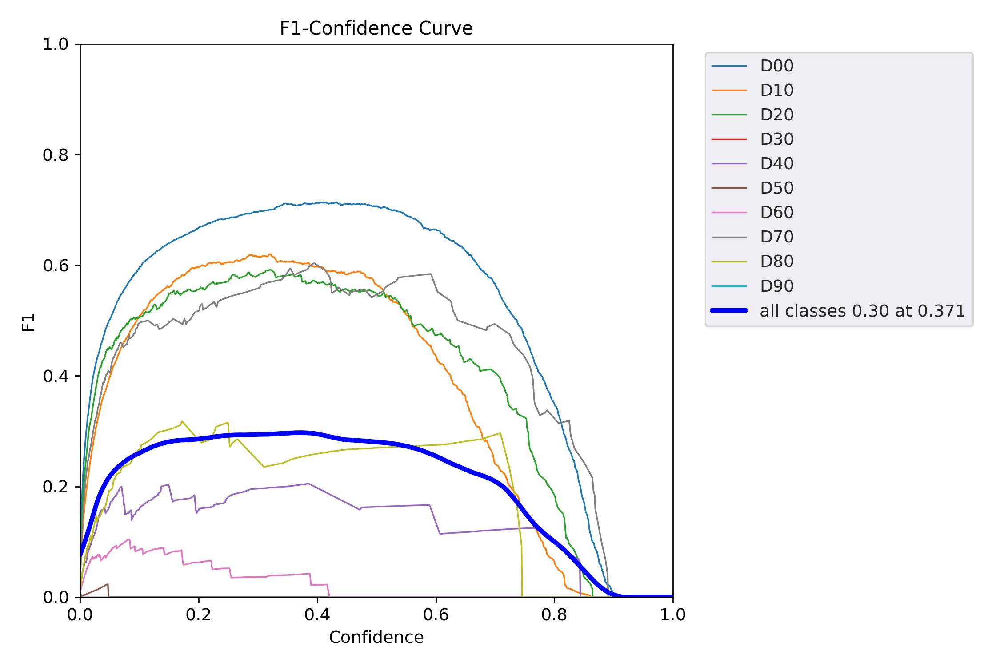

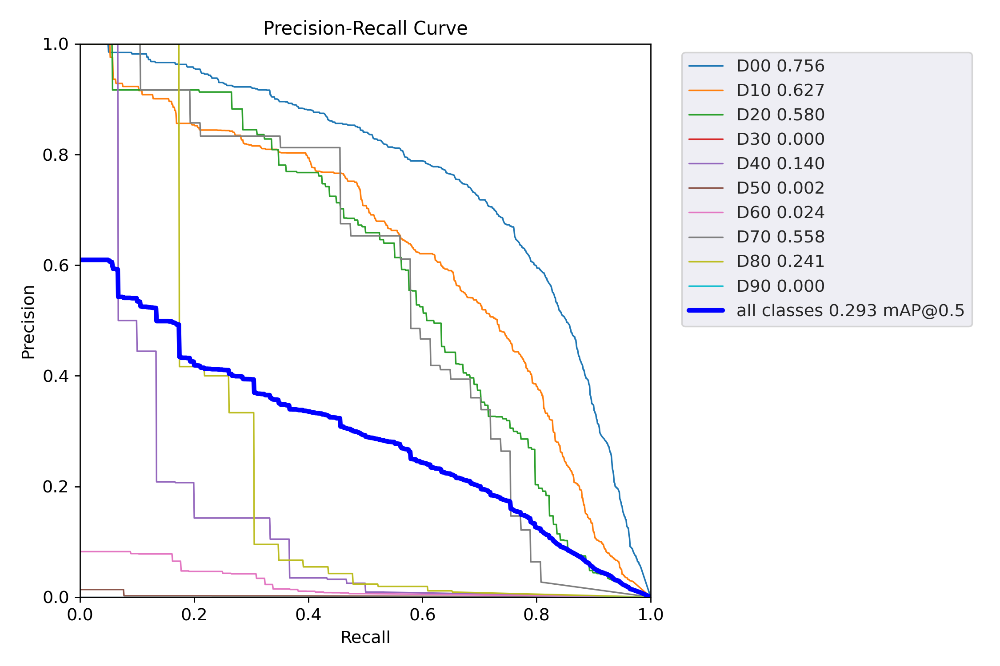

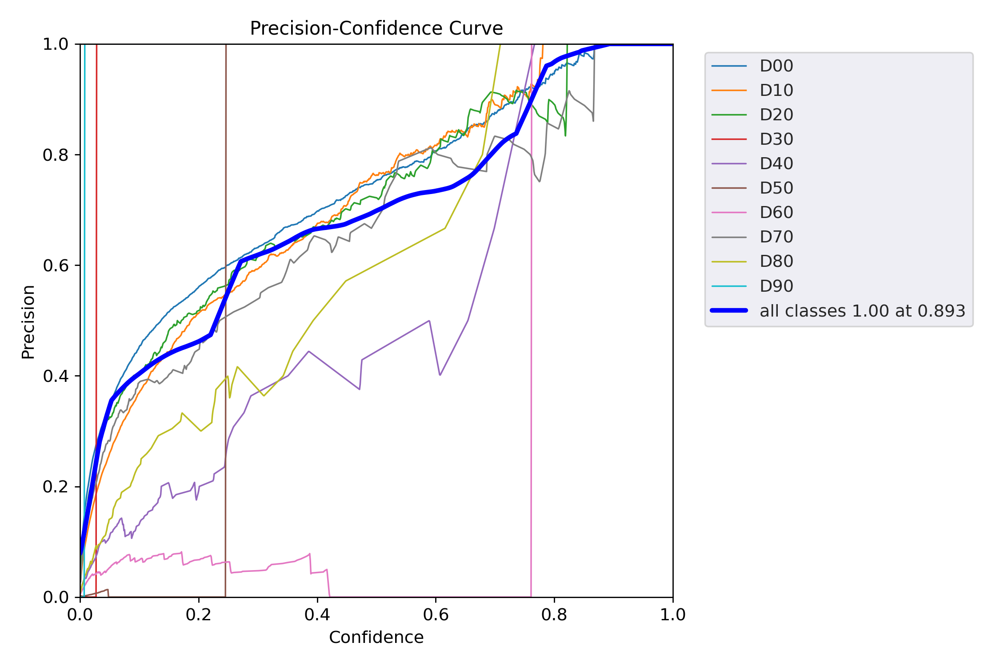

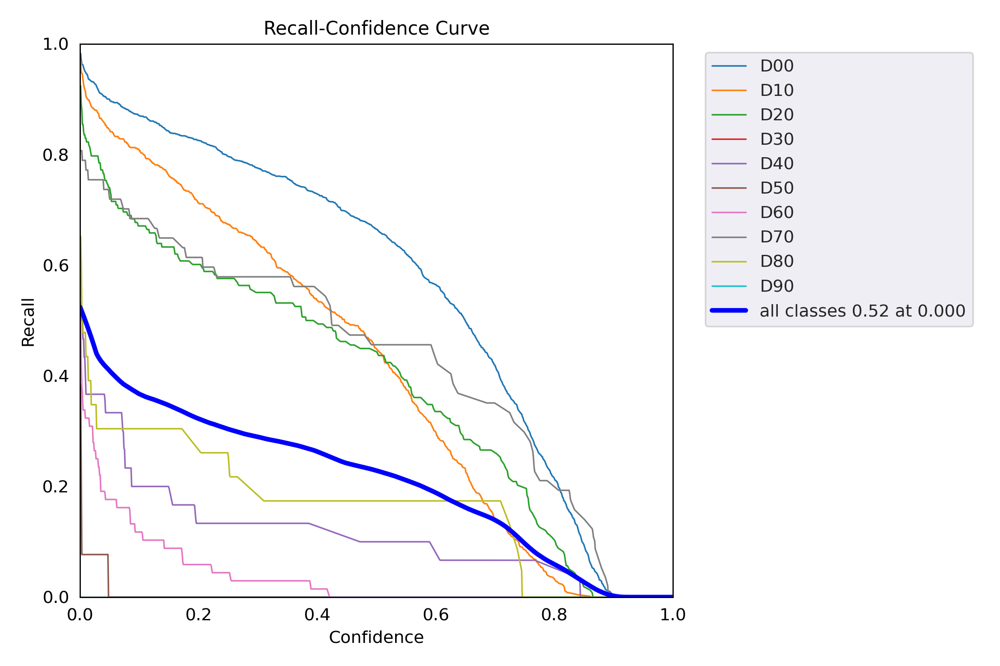

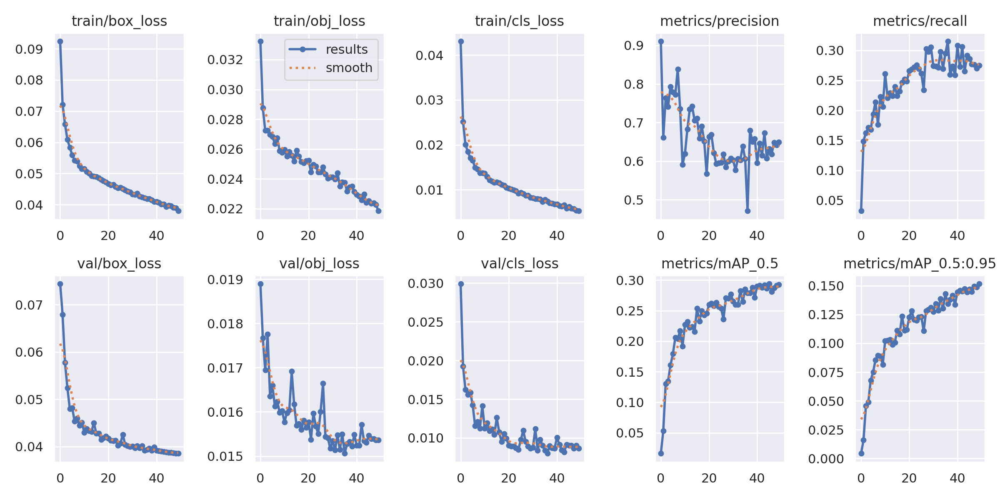

In [ ]:
from IPython.display import Image, display

# List of image paths
image_paths = [
    '/content/yolov5/runs/train/exp6/confusion_matrix.png',
    '/content/yolov5/runs/train/exp6/F1_curve.png',
    '/content/yolov5/runs/train/exp6/PR_curve.png',
    '/content/yolov5/runs/train/exp6/P_curve.png',
    '/content/yolov5/runs/train/exp6/R_curve.png',
    '/content/yolov5/runs/train/exp6/results.png'
]

# Display images
for image_path in image_paths:
    display(Image(filename=image_path))

## India

In [ ]:
!cp /content/india/data.yaml /content/yolov5/data.yaml

In [ ]:
!python train.py --img 640 --batch 16 --epochs 50 --data data.yaml --weights yolov5s.pt --cache

2024-04-02 20:38:27.622278: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-04-02 20:38:27.622328: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-04-02 20:38:27.709660: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
train: weights=yolov5s.pt, cfg=, data=data.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=50, batch_size=16, imgsz=640, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, evolve_population=data/hyps, resume_evolve=None, bucket=, cache=ram, image_weights=False, device=, multi_scale=False, single_cls=False, optimi

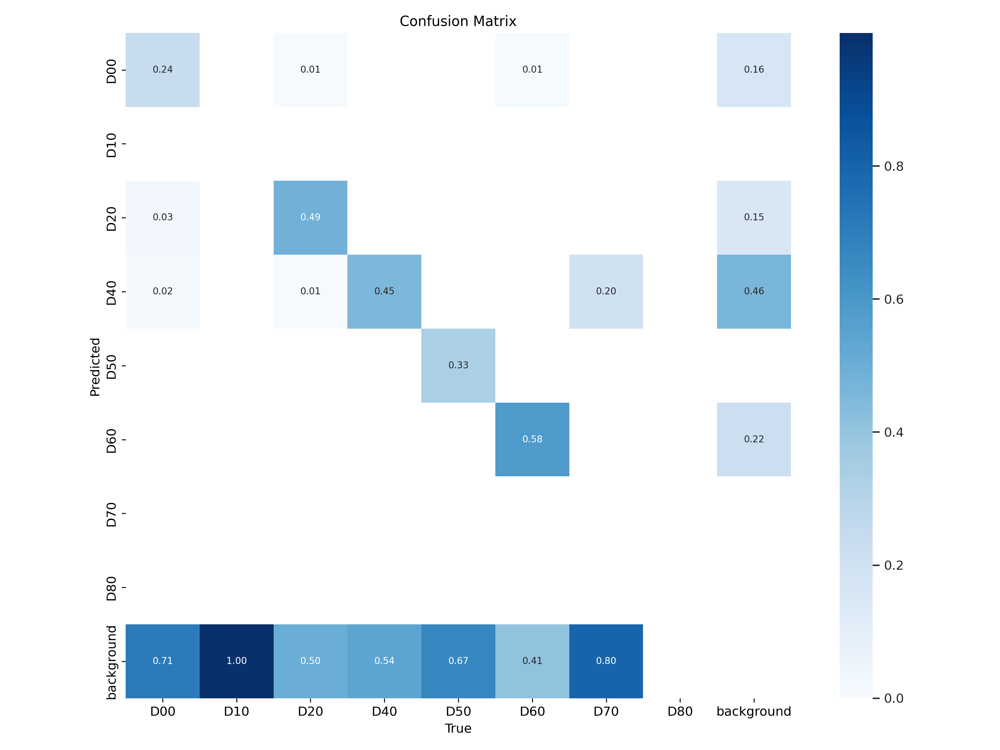

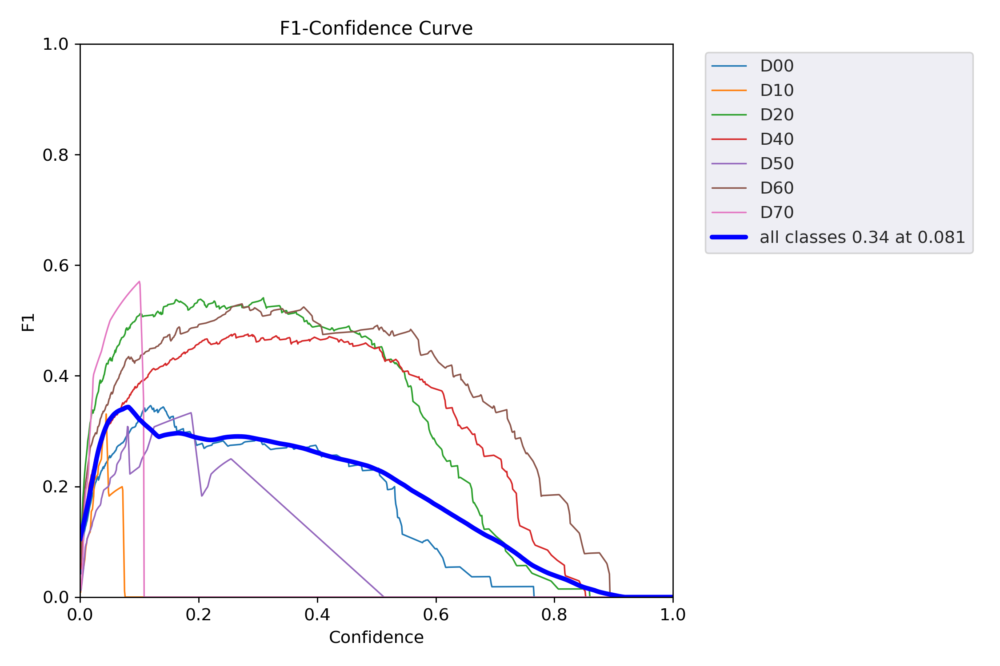

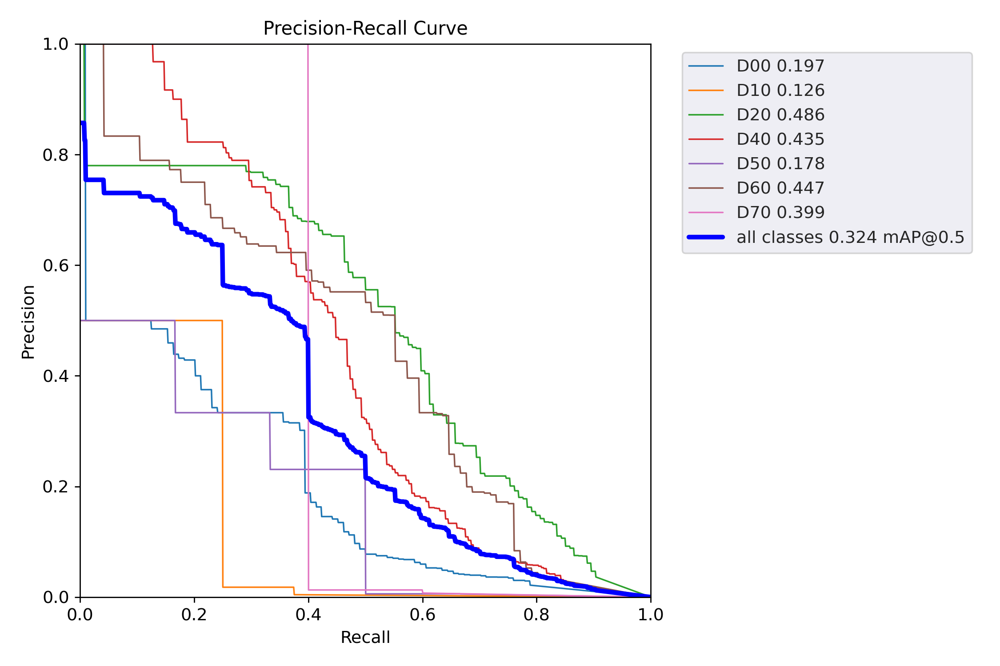

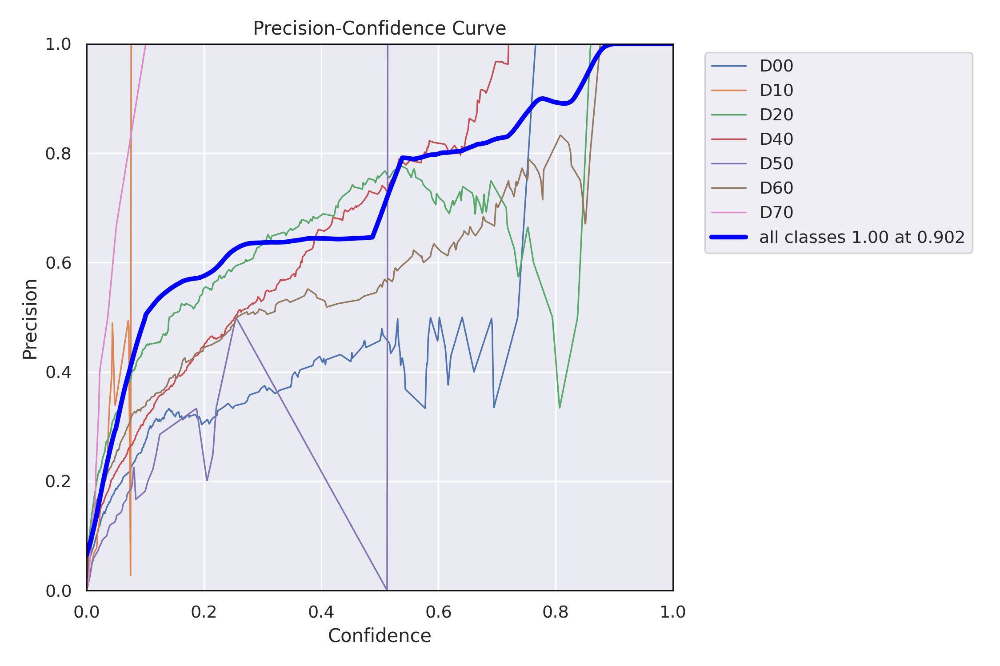

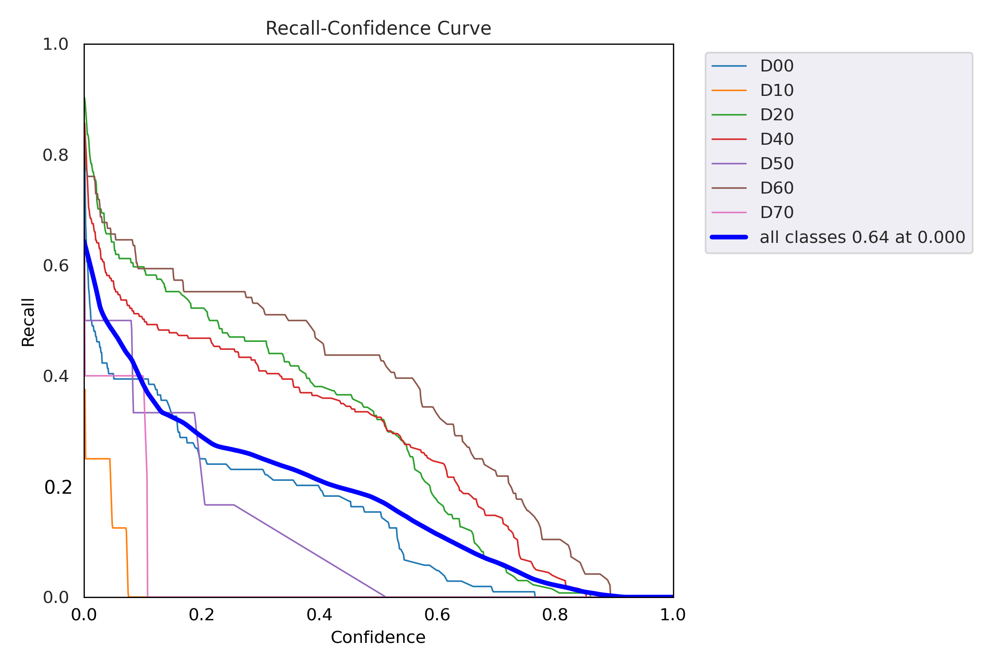

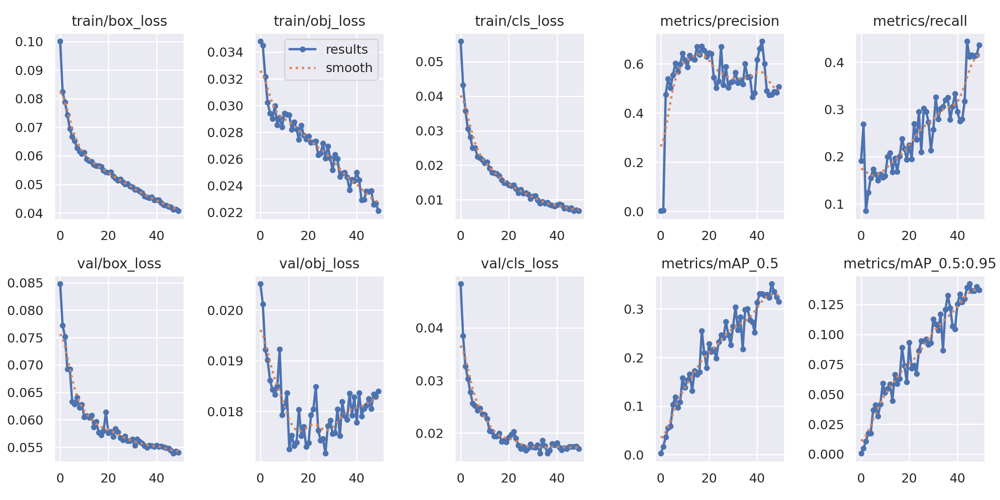

In [ ]:
from IPython.display import Image, display

# List of image paths
image_paths = [
    '/content/yolov5/runs/train/exp7/confusion_matrix.png',
    '/content/yolov5/runs/train/exp7/F1_curve.png',
    '/content/yolov5/runs/train/exp7/PR_curve.png',
    '/content/yolov5/runs/train/exp7/P_curve.png',
    '/content/yolov5/runs/train/exp7/R_curve.png',
    '/content/yolov5/runs/train/exp7/results.png'
]

# Display images
for image_path in image_paths:
    display(Image(filename=image_path))

## Japan

In [ ]:
!python train.py --img 640 --batch 16 --epochs 50 --data data.yaml --weights yolov5s.pt --cache

train: weights=yolov5s.pt, cfg=, data=data.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=50, batch_size=16, imgsz=640, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, evolve_population=data/hyps, resume_evolve=None, bucket=, cache=ram, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=runs/train, name=exp, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, seed=0, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest, ndjson_console=False, ndjson_file=False
github: up to date with https://github.com/ultralytics/yolov5 ✅
YOLOv5 🚀 v7.0-304-g22361691 Python-3.10.12 torch-2.2.1+cu121 CPU

hyperparameters: lr0=0.01, lrf=0.01, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_momentum=0.8, warmup_bias_lr=0.1, box=0.05, cls=0.5, cls_pw=1.0, obj=1.0, obj_pw=1.0, iou_t=0.2,

# Norway

In [8]:
import shutil
import os

# Directories to delete
directories = [
    '/content/yolov5/train',
    '/content/yolov5/valid'
]

# Delete directories
for directory in directories:
    if os.path.exists(directory):
        shutil.rmtree(directory)
        print(f"{directory} deleted successfully!")
    else:
        print(f"{directory} does not exist.")

/content/yolov5/train deleted successfully!
/content/yolov5/valid deleted successfully!


In [ ]:
!python train.py --img 640 --batch 16 --epochs 50 --data /content/yolov5/data.yaml --weights yolov5s.pt --cache

2024-04-22 13:14:44.173182: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-04-22 13:14:44.173237: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-04-22 13:14:44.174833: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
train: weights=yolov5s.pt, cfg=, data=/content/yolov5/data.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=50, batch_size=16, imgsz=640, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, evolve_population=data/hyps, resume_evolve=None, bucket=, cache=ram, image_weights=False, device=, multi_scale=False, single_c

In [ ]:
from IPython.display import Image, display

# List of image paths
image_paths = [
    '/content/yolov5/runs/train/exp/confusion_matrix.png',
    '/content/yolov5/runs/train/exp/F1_curve.png',
    '/content/yolov5/runs/train/exp/PR_curve.png',
    '/content/yolov5/runs/train/exp/P_curve.png',
    '/content/yolov5/runs/train/exp/R_curve.png',
    '/content/yolov5/runs/train/exp/results.png',
    '/content/yolov5/runs/train/exp/val_batch0_labels.jpg',
    '/content/yolov5/runs/train/exp/val_batch0_pred.jpg'
]

# Display images
for image_path in image_paths:
    display(Image(filename=image_path))